In [6]:
from networkx.algorithms import bipartite
from collections import defaultdict
import os
import pickle
import networkx as nx
import pandas as pd
from tqdm import tqdm
from dotmotif import Motif, GrandIsoExecutor

filename = "graph_2000-12-31.pkl"
folder_path = "C:\\Users\\ersin\\KOD\\tez_v7\\quarterly_graphs"
file_path = os.path.join(folder_path, filename)
G = pickle.load(open(file_path, 'rb'))


print(bipartite.is_bipartite(G))


False


In [88]:
filename = "graph_1999-06-30.pkl"
folder_path = "C:\\Users\\ersin\\KOD\\tez_v7\\quarterly_graphs"
file_path = os.path.join(folder_path, filename)
G = pickle.load(open(file_path, 'rb'))


gl = []
a = []
for idx, edge in enumerate(G.edges(data=True)):
        source, target, edge_attrs = edge
        gl.append(edge[2]['share_change'])
        a.append(edge[2]['volatility_category'])


In [92]:
type(a[10])

str

In [8]:
gl[-1:-20:-1]

['Sale',
 'Sale',
 'Sale',
 'Sale',
 'Sale',
 'Sale',
 'Sale',
 'Sale',
 'Sale',
 'Sale',
 'Large Sale',
 'Sale',
 'Large Sale',
 'Sale',
 'Large Sale',
 'Sale',
 'Large Sale',
 'Sale',
 'Sale']

################################################################################################################

# USED MOTIFS

In [ ]:
####################################### LIVE ######################################################################
def calculate_motif1(G):
    """a small investor makes a significant sale of a stock, 
    and the same stock experiences a significant buy from 
    a large investor. """
    
    motif_count = 0

    for node in G.nodes(data=True):
        if node[1]['type'] == 'small_investor':
            small_investor = node[0]

            for successor_stock in G.successors(small_investor):
                for successor_large_investor in G.successors(successor_stock):
                    if G.nodes[successor_large_investor]['type'] == 'large_investor':
                        # Check if there is a significant edge between small investor and stock
                        edge_small_stock = G.get_edge_data(small_investor, successor_stock)
                        if edge_small_stock and edge_small_stock['share_change'] == 'Significant Sale':
                            # Check if there is a significant edge between stock and large investor
                            edge_stock_large = G.get_edge_data(successor_stock, successor_large_investor)
                            if edge_stock_large and edge_stock_large['share_change'] == 'Significant Buy':
                                motif_count += 1

    return motif_count

###################################################################################################################



def calculate_motif2(G):
    """a small investor makes a significant sale of a stock with a late filing delay, 
    and the same stock experiences a significant buy from 
    a large investor with a late filing delay"""
    motif_count = 0

    for node in G.nodes(data=True):
        if node[1]['type'] == 'small_investor':
            small_investor = node[0]

            for successor_stock in G.successors(small_investor):
                for successor_large_investor in G.successors(successor_stock):
                    if G.nodes[successor_large_investor]['type'] == 'large_investor':
                        # Check if there is a significant edge between small investor and stock
                        edge_small_stock = G.get_edge_data(small_investor, successor_stock)
                        if edge_small_stock and edge_small_stock['share_change'] == 'Significant Sale' and edge_small_stock['filing_delay'] == 'late':
                            # Check if there is a significant edge between stock and large investor
                            edge_stock_large = G.get_edge_data(successor_stock, successor_large_investor)
                            if edge_stock_large and edge_stock_large['share_change'] == 'Significant Buy' and edge_stock_large['filing_delay'] == 'late':
                                motif_count += 1

    return motif_count

###################################################################################################################

def calculate_motif3(G):
    """two different large investors both make a significant sale of the same stock"""
    motif_count = 0

    large_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'large_investor']

    for large_investor1 in large_investors:
        for large_investor2 in large_investors:
            if large_investor1 != large_investor2:
                for successor_stock in G.successors(large_investor1):
                    if G.has_edge(large_investor1, successor_stock) and G.has_edge(large_investor2, successor_stock):
                        edge1 = G.get_edge_data(large_investor1, successor_stock)
                        edge2 = G.get_edge_data(large_investor2, successor_stock)

                        if edge1['share_change'] == 'Significant Sale' and edge2['share_change'] == 'Significant Sale':
                            motif_count += 1

    return motif_count


###################################################################################################################


## 1 ANTIs
def calculate_motif4(G): 
    """a small investor makes a significant sale of a stock, 
    and the same stock experiences a significant buy from 
    a large investor. """
    
    motif_count = 0

    for node in G.nodes(data=True):
        if node[1]['type'] == 'large_investor':
            small_investor = node[0]

            for successor_stock in G.successors(small_investor):
                for successor_large_investor in G.successors(successor_stock):
                    if G.nodes[successor_large_investor]['type'] == 'small_investor':
                        # Check if there is a significant edge between small investor and stock
                        edge_small_stock = G.get_edge_data(small_investor, successor_stock)
                        if edge_small_stock and edge_small_stock['share_change'] == 'Significant Sale':
                            # Check if there is a significant edge between stock and large investor
                            edge_stock_large = G.get_edge_data(successor_stock, successor_large_investor)
                            if edge_stock_large and edge_stock_large['share_change'] == 'Significant Buy':
                                motif_count += 1

    return motif_count

###################################################################################################################
## 2 ANTI
def calculate_motif5(G):
    """a small investor makes a significant sale of a stock with a late filing delay, 
    and the same stock experiences a significant buy from 
    a large investor with a late filing delay"""
    motif_count = 0

    for node in G.nodes(data=True):
        if node[1]['type'] == 'large_investor':
            small_investor = node[0]

            for successor_stock in G.successors(small_investor):
                for successor_large_investor in G.successors(successor_stock):
                    if G.nodes[successor_large_investor]['type'] == 'small_investor':
                        # Check if there is a significant edge between small investor and stock
                        edge_small_stock = G.get_edge_data(small_investor, successor_stock)
                        if edge_small_stock and edge_small_stock['share_change'] == 'Significant Sale' and edge_small_stock['filing_delay'] == 'late':
                            # Check if there is a significant edge between stock and large investor
                            edge_stock_large = G.get_edge_data(successor_stock, successor_large_investor)
                            if edge_stock_large and edge_stock_large['share_change'] == 'Significant Buy' and edge_stock_large['filing_delay'] == 'late':
                                motif_count += 1

    return motif_count


###################################################################################################################



## 3 ANTI
def calculate_motif6(G):
    """two different small investors both make a significant sale of the same stock"""
    motif_count = 0

    large_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'small_investor']

    for large_investor1 in large_investors:
        for large_investor2 in large_investors:
            if large_investor1 != large_investor2:
                for successor_stock in G.successors(large_investor1):
                    if G.has_edge(large_investor1, successor_stock) and G.has_edge(large_investor2, successor_stock):
                        edge1 = G.get_edge_data(large_investor1, successor_stock)
                        edge2 = G.get_edge_data(large_investor2, successor_stock)

                        if edge1['share_change'] == 'Significant Sale' and edge2['share_change'] == 'Significant Sale':
                            motif_count += 1

    return motif_count

###################################################################################################################

####################################### LIVE ##########################################
def calculate_motif7(G):
    """a small investor makes a sale of a stock, 
    and the same stock experiences a buy from 
    a large investor. """
    
    motif_count = 0

    for node in G.nodes(data=True):
        if node[1]['type'] == 'small_investor':
            small_investor = node[0]

            for successor_stock in G.successors(small_investor):
                for successor_large_investor in G.successors(successor_stock):
                    if G.nodes[successor_large_investor]['type'] == 'large_investor':
                        # Check if there is a significant edge between small investor and stock
                        edge_small_stock = G.get_edge_data(small_investor, successor_stock)
                        if edge_small_stock and 'Sale' in edge_small_stock['share_change']:
                            # Check if there is a significant edge between stock and large investor
                            edge_stock_large = G.get_edge_data(successor_stock, successor_large_investor)
                            if edge_stock_large and 'Buy' in edge_stock_large['share_change']:
                                motif_count += 1

    return motif_count

#######################################################################################
####################################### LIVE ##########################################

def calculate_motif8(G):
    """a large investor makes a sale of a stock, 
    and the same stock experiences a buy from 
    a small investor. """
    
    motif_count = 0

    for node in G.nodes(data=True):
        if node[1]['type'] == 'large_investor':
            small_investor = node[0]

            for successor_stock in G.successors(small_investor):
                for successor_large_investor in G.successors(successor_stock):
                    if G.nodes[successor_large_investor]['type'] == 'small_investor':
                        # Check if there is a significant edge between small investor and stock
                        edge_small_stock = G.get_edge_data(small_investor, successor_stock)
                        if edge_small_stock and 'Sale' in edge_small_stock['share_change']:
                            # Check if there is a significant edge between stock and large investor
                            edge_stock_large = G.get_edge_data(successor_stock, successor_large_investor)
                            if edge_stock_large and 'Buy' in edge_stock_large['share_change']:
                                motif_count += 1

    return motif_count



#######################################################################################








################################################################################################################

In [15]:
def calculate_motif4(G):
    """two different large investors both make a significant buy of the same stock"""
    motif_count = 0

    large_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'large_investor']

    for large_investor1 in large_investors:
        for large_investor2 in large_investors:
            if large_investor1 != large_investor2:
                for successor_stock in G.successors(large_investor1):
                    if G.has_edge(large_investor1, successor_stock) and G.has_edge(large_investor2, successor_stock):
                        edge1 = G.get_edge_data(large_investor1, successor_stock)
                        edge2 = G.get_edge_data(large_investor2, successor_stock)

                        if edge1['share_change'] == 'Significant Buy' and edge2['share_change'] == 'Significant Buy':
                            motif_count += 1

    return motif_count

motif_count = calculate_motif4(G)
print("Motif count: ", motif_count)

Motif count:  1628


In [93]:
def calculate_motif9(G):
    """a small investor makes a sale of a volatile stock, 
    and the same stock experiences a buy from a large investor. """
    
    motif_count = 0

    for node in G.nodes(data=True):
        if node[1]['type'] == 'small_investor':
            small_investor = node[0]

            for successor_stock in G.successors(small_investor):
                for successor_large_investor in G.successors(successor_stock):
                    if G.nodes[successor_large_investor]['type'] == 'large_investor':
                        # Check if there is a significant edge between small investor and stock
                        edge_small_stock = G.get_edge_data(small_investor, successor_stock)
                        if edge_small_stock and 'Sale' in edge_small_stock['share_change'] and type(edge_small_stock['volatility_category']) == str and 'low' in edge_small_stock['volatility_category']:
                            # Check if there is a significant edge between stock and large investor
                            edge_stock_large = G.get_edge_data(successor_stock, successor_large_investor)
                            if edge_stock_large and 'Buy' in edge_stock_large['share_change']:
                                motif_count += 1

    return motif_count

motif_count = calculate_motif9(G)
print("Motif count: ", motif_count)

Motif count:  31059


In [100]:
from networkx.algorithms import bipartite
from statistics import mean


def remove_non_bipartite_edges(G):
    non_bipartite_edges = [(u, v) for u, v in G.edges() if G.nodes[u].get('bipartite') == G.nodes[v].get('bipartite')]
    G.remove_edges_from(non_bipartite_edges)
    return G


#######################################################################################
####################################### LIVE ##########################################
def calculate_motif9(G):
    """a small investor makes a sale of a volatile stock, 
    and the same stock experiences a buy from a large investor. """
    
    motif_count = 0

    for node in G.nodes(data=True):
        if node[1]['type'] == 'small_investor':
            small_investor = node[0]

            for successor_stock in G.successors(small_investor):
                for successor_large_investor in G.successors(successor_stock):
                    if G.nodes[successor_large_investor]['type'] == 'large_investor':
                        # Check if there is a significant edge between small investor and stock
                        edge_small_stock = G.get_edge_data(small_investor, successor_stock)
                        if edge_small_stock and 'Sale' in edge_small_stock['share_change'] and type(edge_small_stock['volatility_category']) == str and 'high' in edge_small_stock['volatility_category']:
                            # Check if there is a significant edge between stock and large investor
                            edge_stock_large = G.get_edge_data(successor_stock, successor_large_investor)
                            if edge_stock_large and 'Buy' in edge_stock_large['share_change']:
                                motif_count += 1

    return motif_count

#######################################################################################
def calculate_motif10(G):
    """a large investor makes a sale of a volatile stock, 
    and the same stock experiences a buy from a small investor. """
    
    motif_count = 0

    for node in G.nodes(data=True):
        if node[1]['type'] == 'large_investor':
            small_investor = node[0]

            for successor_stock in G.successors(small_investor):
                for successor_large_investor in G.successors(successor_stock):
                    if G.nodes[successor_large_investor]['type'] == 'small_investor':
                        # Check if there is a significant edge between small investor and stock
                        edge_small_stock = G.get_edge_data(small_investor, successor_stock)
                        if edge_small_stock and 'Sale' in edge_small_stock['share_change'] and type(edge_small_stock['volatility_category']) == str and 'high' in edge_small_stock['volatility_category']:
                            # Check if there is a significant edge between stock and large investor
                            edge_stock_large = G.get_edge_data(successor_stock, successor_large_investor)
                            if edge_stock_large and 'Buy' in edge_stock_large['share_change']:
                                motif_count += 1

    return motif_count
#######################################################################################

def calculate_motif11(G):
    """a small investor makes a sale of a low volume stock, 
    and the same stock experiences a buy from a large investor. """
    
    motif_count = 0

    for node in G.nodes(data=True):
        if node[1]['type'] == 'small_investor':
            small_investor = node[0]

            for successor_stock in G.successors(small_investor):
                for successor_large_investor in G.successors(successor_stock):
                    if G.nodes[successor_large_investor]['type'] == 'large_investor':
                        # Check if there is a significant edge between small investor and stock
                        edge_small_stock = G.get_edge_data(small_investor, successor_stock)
                        if edge_small_stock and 'Sale' in edge_small_stock['share_change'] and type(edge_small_stock['volume_category']) == str and 'low' in edge_small_stock['volume_category']:
                            # Check if there is a significant edge between stock and large investor
                            edge_stock_large = G.get_edge_data(successor_stock, successor_large_investor)
                            if edge_stock_large and 'Buy' in edge_stock_large['share_change']:
                                motif_count += 1

    return motif_count

#######################################################################################
def calculate_motif12(G):
    """a small investor makes a sale of a low volume stock, 
    and the same stock experiences a buy from a large investor. """
    
    motif_count = 0

    for node in G.nodes(data=True):
        if node[1]['type'] == 'large_investor':
            small_investor = node[0]

            for successor_stock in G.successors(small_investor):
                for successor_large_investor in G.successors(successor_stock):
                    if G.nodes[successor_large_investor]['type'] == 'small_investor':
                        # Check if there is a significant edge between small investor and stock
                        edge_small_stock = G.get_edge_data(small_investor, successor_stock)
                        if edge_small_stock and 'Sale' in edge_small_stock['share_change'] and type(edge_small_stock['volume_category']) == str and 'low' in edge_small_stock['volume_category']:
                            # Check if there is a significant edge between stock and large investor
                            edge_stock_large = G.get_edge_data(successor_stock, successor_large_investor)
                            if edge_stock_large and 'Buy' in edge_stock_large['share_change']:
                                motif_count += 1

    return motif_count




def extract_metrics_from_graph(G):

    return [calculate_motif9(G), calculate_motif10(G), calculate_motif11(G), calculate_motif12(G)]
    
    
#######################################################################################

def open_and_close_graphs(folder_path):
    """
    Opens each graph in pickle format from a folder, extracts various properties, and then closes it.
    
    :param folder_path: Path to the folder containing the graphs.
    :return: A DataFrame with columns for filename, motifs1, motifs2, motifs3, motifs4, disparity, density, and clustering.
    """
    data_rows = []
    for filename in tqdm(os.listdir(folder_path)):
        
        if filename.endswith(".pkl"):
            file_path = os.path.join(folder_path, filename)
            
            with open(file_path, 'rb') as file:
                
                G = pickle.load(file)
                G = remove_non_bipartite_edges(G)
                date = filename.split('_')[1].split('.')[0]
                
                
                ##### DEFINE SUBGRAPHS ######
                
                software_lst = ["Services-Computer Programming Services",
                                "Services-Prepackaged Software",
                                "Services-Computer Integrated Systems Design",
                                "Services-Computer Processing & Data Preparation",
                                "Services-Computer Programming, Data Processing, Etc."]
                
                # INDUSTRY GRAPHS
                selected_edges = [(u,v) for u,v,e in G.edges(data=True) if e['industry'] in software_lst]
                H_software_industry = G.edge_subgraph(selected_edges).copy()
                
                oil_lst = ["Crude Petroleum & Natural Gas",
                            "Drilling Oil & Gas Wells",
                            "Oil & Gas Field Exploration Services",
                            "Oil & Gas Field Services, NEC"]
                
                selected_edges = [(u,v) for u,v,e in G.edges(data=True) if e['industry'] in oil_lst]
                H_oil_industry = G.edge_subgraph(selected_edges).copy()
                
                finance_industry = ["Mortgage Bankers & Loan Correspondents",
                                    "Real Estate", 
                                    "Real Estate Operators (No Developers) & Lessors", 
                                    "Operators of Nonresidential Buildings",
                                    "Operators of Apartment Buildings",
                                    "Lessors of Real Property, NEC",
                                    "Real Estate Agents & Managers (For Others)",
                                    "Real Estate Dealers (For Their Own Account)",
                                    "Land Subdividers & Developers (No Cemeteries)" ,
                                    "Real Estate Investment Trusts"]
                
                selected_edges = [(u,v) for u,v,e in G.edges(data=True) if e['industry'] in finance_industry]
                H_real_estate_industry = G.edge_subgraph(selected_edges).copy()

                
                graph_types = ['total_graph', 'software_industry', 'oil_industry', 'real_estate_industry']
                subgraphs = [G, H_software_industry, H_oil_industry, H_real_estate_industry]
                
                ##########################################################################################
                
                metrics_dict = {}
                
                metrics_dict['date'] = date
                
                for graph_type, graph in zip(graph_types, subgraphs):
                    metrics = extract_metrics_from_graph(graph)
                    # Prefixing each metric with the graph type
                    metrics_dict.update({f'{graph_type}_{metric}': value for metric, value in zip(['motif9', 'motif10',
                                                                                                  'motif11', 'motif12'], metrics)})

                # Append the row to the list
                data_rows.append(metrics_dict)
        #break
    # Create a DataFrame from the list of rows
    df = pd.DataFrame(data_rows)
    return df

In [101]:
dataframe = open_and_close_graphs("""C:\\Users\\ersin\\KOD\\tez_v7\\quarterly_graphs""")

100%|██████████████████████████████████████████████████████████████████████████████████| 74/74 [09:59<00:00,  8.10s/it]


In [102]:
dataframe.head()

,date,total_graph_motif9,total_graph_motif10,total_graph_motif11,total_graph_motif12,software_industry_motif9,software_industry_motif10,software_industry_motif11,software_industry_motif12,oil_industry_motif9,oil_industry_motif10,oil_industry_motif11,oil_industry_motif12,real_estate_industry_motif9,real_estate_industry_motif10,real_estate_industry_motif11,real_estate_industry_motif12
0,1999-06-30,39167,50541,3489,3654,3829,5572,62,216,359,326,18,17,325,363,278,288
1,1999-09-30,14073,22121,3286,3346,1928,1512,365,118,456,596,9,14,31,16,203,259
2,1999-12-31,44403,73676,3200,3453,2175,3546,47,61,602,743,11,15,348,347,119,114
3,2000-03-31,73496,91387,2452,3224,5672,7607,143,295,772,774,0,23,253,243,225,304
4,2000-06-30,54702,69085,2635,2977,6340,9236,128,174,406,909,0,26,276,89,92,286


In [103]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def plot_dataframe(df_clustering, title): 

    # Convert the index to datetime
    df_clustering.index = pd.to_datetime(df_clustering.index)

    dot_com_start = '2000-06-30'
    dot_com_end = '2002-12-31'

    financial_start = '2007-12-31'
    financial_end = '2009-12-31'

    oil_start = '2014-06-30'
    oil_end = '2016-03-31'

    # Plotting
    ax = df_clustering.plot(kind="line", figsize=(20, 6), style=["-", "-", "-", "-", "--", "--", "--"], legend=True)
    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Value")

    # Set x-axis labels to each date in the DataFrame's index, skipping one by one
    xticks_labels = df_clustering.index[::2]  # Change the number '2' to skip more/less
    plt.xticks(ticks=xticks_labels, labels=[label.strftime('%Y-%m-%d') for label in xticks_labels], rotation=45)

    # Apply colored spans
    ax.axvspan(pd.to_datetime(dot_com_start), pd.to_datetime(dot_com_end), color='yellow', alpha=0.3, label='Dot-com Bubble')
    ax.axvspan(pd.to_datetime(financial_start), pd.to_datetime(financial_end), color='orange', alpha=0.3, label='2008 Financial Crisis')
    ax.axvspan(pd.to_datetime(oil_start), pd.to_datetime(oil_end), color='red', alpha=0.3, label='Oil Price Shock')

    plt.grid(True)
    plt.show()

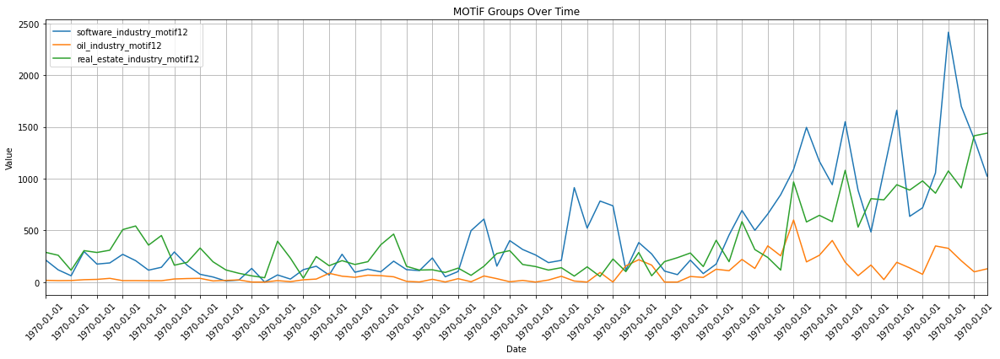

In [114]:
def drop_cols(df, substring):
    return df.loc[:, ~df.columns.str.contains(substring)]

def create_dataframe_with_substring(df, substring):
    filtered_columns = [col for col in df.columns if substring in col]
    return df[filtered_columns]

substring = "total"
dfd = drop_cols(dataframe.copy(), substring)

df4 = create_dataframe_with_substring(dfd, "motif12")
plot_dataframe(df4, "MOTİF Groups Over Time")

In [115]:
dataframe.to_csv("motif_results_4.csv")

# MOTIFS CHAPTER 2

In [24]:
from networkx.algorithms import bipartite
from statistics import mean


def remove_non_bipartite_edges(G):
    non_bipartite_edges = [(u, v) for u, v in G.edges() if G.nodes[u].get('bipartite') == G.nodes[v].get('bipartite')]
    G.remove_edges_from(non_bipartite_edges)
    return G


def calculate_motif6(G):
    
    """small investor performs a significant buy of a stock, 
    and another small investor performs a significant sale of the same stock."""
    motif_count = 0

    small_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'small_investor']

    for small_investor_buy in small_investors:
        for small_investor_sell in small_investors:
            if small_investor_buy != small_investor_sell:
                for successor_stock in G.successors(small_investor_buy):
                    if G.has_edge(small_investor_buy, successor_stock) and G.has_edge(small_investor_sell, successor_stock):
                        edge_buy = G.get_edge_data(small_investor_buy, successor_stock)
                        edge_sell = G.get_edge_data(small_investor_sell, successor_stock)

                        if edge_buy['share_change'] == 'Significant Buy' and edge_sell['share_change'] == 'Significant Sale':
                            motif_count += 1

    return motif_count


def calculate_motif7(G):
    """a large investor makes a late significant sale of a stock, 
    and a small investor significantly buys the same stock late"""
    motif_count = 0

    large_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'large_investor']

    for large_investor_sale in large_investors:
        for successor_stock in G.successors(large_investor_sale):
            edge_sale = G.get_edge_data(large_investor_sale, successor_stock)
            if edge_sale and edge_sale['share_change'] == 'Significant Sale' and edge_sale['filing_delay'] == 'late':
                for small_investor_buy in G.successors(successor_stock):
                    edge_buy = G.get_edge_data(successor_stock, small_investor_buy)
                    if edge_buy and edge_buy['share_change'] == 'Significant Buy' and edge_buy['filing_delay'] == 'late':
                        motif_count += 1

    return motif_count

    

def calculate_motif8(G):
    
    """a large investor makes a significant sale of a stock, 
    and a small investor significantly buys the same stock"""
    motif_count = 0

    large_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'large_investor']

    for large_investor_sale in large_investors:
        for successor_stock in G.successors(large_investor_sale):
            edge_sale = G.get_edge_data(large_investor_sale, successor_stock)
            if edge_sale and edge_sale['share_change'] == 'Significant Sale':
                for small_investor_buy in G.successors(successor_stock):
                    edge_buy = G.get_edge_data(successor_stock, small_investor_buy)
                    if edge_buy and edge_buy['share_change'] == 'Significant Buy':
                        motif_count += 1

    return motif_count


def calculate_motif9(G):
    """a small investor significantly sells a small stock, and the same investor significantly buys a large stock"""
    motif_count = 0

    small_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'small_investor']

    for small_investor in small_investors:
        for successor_small_stock in G.successors(small_investor):
            edge_sale_small_stock = G.get_edge_data(small_investor, successor_small_stock)
            if edge_sale_small_stock and edge_sale_small_stock['share_change'] == 'Significant Sale' and G.nodes[successor_small_stock]['type'] == 'small':
                for successor_large_stock in G.successors(small_investor):
                    if successor_large_stock != successor_small_stock:
                        edge_buy_large_stock = G.get_edge_data(small_investor, successor_large_stock)
                        if edge_buy_large_stock and edge_buy_large_stock['share_change'] == 'Significant Buy' and G.nodes[successor_large_stock]['type'] == 'large':
                            motif_count += 1

    return motif_count





def calculate_motif10(G):
    """a small investor significantly buys a small stock, and the same investor significantly sells a large stock"""
    motif_count = 0

    small_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'small_investor']

    for small_investor in small_investors:
        for successor_small_stock in G.successors(small_investor):
            edge_buy_small_stock = G.get_edge_data(small_investor, successor_small_stock)
            if edge_buy_small_stock and edge_buy_small_stock['share_change'] == 'Significant Buy' and G.nodes[successor_small_stock]['type'] == 'small':
                for successor_large_stock in G.successors(small_investor):
                    if successor_large_stock != successor_small_stock:
                        edge_sale_large_stock = G.get_edge_data(small_investor, successor_large_stock)
                        if edge_sale_large_stock and edge_sale_large_stock['share_change'] == 'Significant Sale' and G.nodes[successor_large_stock]['type'] == 'large':
                            motif_count += 1

    return motif_count





def extract_metrics_from_graph(G):

    return [calculate_motif6(G), calculate_motif7(G), calculate_motif8(G), calculate_motif9(G), calculate_motif10(G)]
    
    


def open_and_close_graphs(folder_path):
    """
    Opens each graph in pickle format from a folder, extracts various properties, and then closes it.
    
    :param folder_path: Path to the folder containing the graphs.
    :return: A DataFrame with columns for filename, motifs1, motifs2, motifs3, motifs4, disparity, density, and clustering.
    """
    data_rows = []
    for filename in tqdm(os.listdir(folder_path)):
        
        if filename.endswith(".pkl"):
            file_path = os.path.join(folder_path, filename)
            
            with open(file_path, 'rb') as file:
                
                G = pickle.load(file)
                G = remove_non_bipartite_edges(G)
                date = filename.split('_')[1].split('.')[0]
                
                
                ##### DEFINE SUBGRAPHS ######
                """       
                # FINANCE SUBGRAPH
                selected_edges = [(u,v) for u,v,e in G.edges(data=True) if e['sector'] == 'Finance Insurance And Real Estate']
                H_finance = G.edge_subgraph(selected_edges).copy()
                
                # OIL SUBGRAPH
                selected_edges = [(u,v) for u,v,e in G.edges(data=True) if e['sector'] == 'Transportation Communications Electric Gas And Sanitary Service']
                H_oil = G.edge_subgraph(selected_edges).copy()

                # SERVICES SUBGRAPH
                selected_edges = [(u,v) for u,v,e in G.edges(data=True) if e['sector'] == 'Services']
                H_services = G.edge_subgraph(selected_edges).copy()
                """
                
                software_lst = ["Services-Computer Programming Services",
                                "Services-Prepackaged Software",
                                "Services-Computer Integrated Systems Design",
                                "Services-Computer Processing & Data Preparation",
                                "Services-Computer Programming, Data Processing, Etc."]
                
                # INDUSTRY GRAPHS
                selected_edges = [(u,v) for u,v,e in G.edges(data=True) if e['industry'] in software_lst]
                H_software_industry = G.edge_subgraph(selected_edges).copy()
                
                oil_lst = ["Crude Petroleum & Natural Gas",
                            "Drilling Oil & Gas Wells",
                            "Oil & Gas Field Exploration Services",
                            "Oil & Gas Field Services, NEC"]
                
                selected_edges = [(u,v) for u,v,e in G.edges(data=True) if e['industry'] in oil_lst]
                H_oil_industry = G.edge_subgraph(selected_edges).copy()
                
                finance_industry = ["Mortgage Bankers & Loan Correspondents",
                                    "Real Estate", 
                                    "Real Estate Operators (No Developers) & Lessors", 
                                    "Operators of Nonresidential Buildings",
                                    "Operators of Apartment Buildings",
                                    "Lessors of Real Property, NEC",
                                    "Real Estate Agents & Managers (For Others)",
                                    "Real Estate Dealers (For Their Own Account)",
                                    "Land Subdividers & Developers (No Cemeteries)" ,
                                    "Real Estate Investment Trusts"]
                
                selected_edges = [(u,v) for u,v,e in G.edges(data=True) if e['industry'] in finance_industry]
                H_real_estate_industry = G.edge_subgraph(selected_edges).copy()

                
                # graph_types = ['total_graph','finance_sector', 'oil_sector', 'services_sector', 'software_industry', 'oil_industry', 'real_estate_industry']
                graph_types = ['total_graph','software_industry', 'oil_industry', 'real_estate_industry']
                
                subgraphs = [G, H_software_industry, H_oil_industry, H_real_estate_industry]
                
                ##########################################################################################
                
                metrics_dict = {}
                
                metrics_dict['date'] = date
                
                for graph_type, graph in zip(graph_types, subgraphs):
                    metrics = extract_metrics_from_graph(graph)
                    # Prefixing each metric with the graph type
                    metrics_dict.update({f'{graph_type}_{metric}': value for metric, value in zip(['motif6', 
                                                                                                   'motif7', 
                                                                                                    'motif8', 
                                                                                                   'motif9', 
                                                                                                   'motif10'], metrics)})

                # Append the row to the list
                data_rows.append(metrics_dict)

    # Create a DataFrame from the list of rows
    df = pd.DataFrame(data_rows)
    return df

dataframe2 = open_and_close_graphs("""C:\\Users\\ersin\\KOD\\tez_v7\\quarterly_graphs""")

100%|██████████████████████████████████████████████████████████████████████████████████| 74/74 [13:23<00:00, 10.86s/it]


In [25]:
dataframe2.head()

,date,total_graph_motif6,total_graph_motif7,total_graph_motif8,total_graph_motif9,total_graph_motif10,software_industry_motif6,software_industry_motif7,software_industry_motif8,software_industry_motif9,...,oil_industry_motif6,oil_industry_motif7,oil_industry_motif8,oil_industry_motif9,oil_industry_motif10,real_estate_industry_motif6,real_estate_industry_motif7,real_estate_industry_motif8,real_estate_industry_motif9,real_estate_industry_motif10
0,1999-06-30,0,1525,17609,0,0,0,72,808,0,...,0,23,229,0,0,0,36,191,0,0
1,1999-09-30,0,1941,16887,0,0,0,80,760,0,...,0,26,300,0,0,0,42,149,0,0
2,1999-12-31,0,363,17766,0,0,0,10,814,0,...,0,5,428,0,0,0,10,134,0,0
3,2000-03-31,0,74,25033,0,0,0,8,1507,0,...,0,0,778,0,0,0,0,245,0,0
4,2000-06-30,0,1712,23830,0,0,0,81,1331,0,...,0,49,668,0,0,0,17,368,0,0


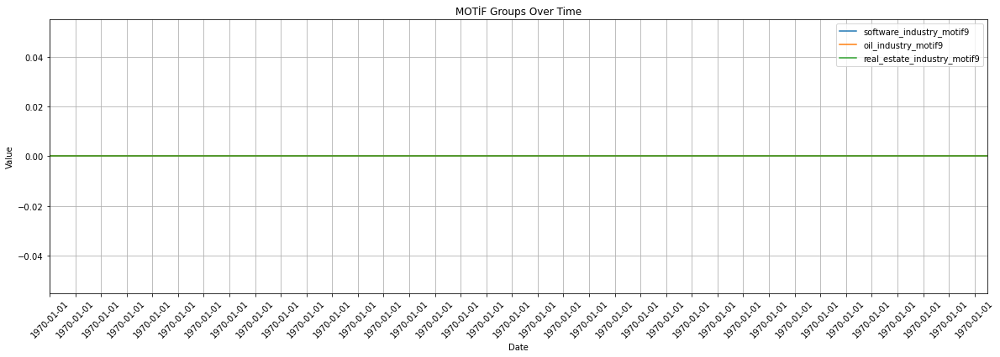

In [26]:
def drop_cols(df, substring):
    return df.loc[:, ~df.columns.str.contains(substring)]

def create_dataframe_with_substring(df, substring):
    filtered_columns = [col for col in df.columns if substring in col]
    return df[filtered_columns]

substring = "total"
dfd = drop_cols(dataframe2.copy(), substring)

df4 = create_dataframe_with_substring(dfd, "motif9")

plot_dataframe(df4, "MOTİF Groups Over Time")

In [27]:
dataframe2.to_csv("motif_results_2.csv")

In [139]:
def calculate_motif11(G):
    """a large investor significantly sells a small stock and significantly buys a large stock at the same time"""
    motif_count = 0

    large_investors = [node for node, data in G.nodes(data=True) if data['bipartite'] == 0]

    for large_investor in large_investors:
        for successor_small_stock in G.successors(large_investor):
            
            edge_sale_small_stock = G.get_edge_data(large_investor, successor_small_stock)
            print(edge_sale_small_stock)
            if (
                edge_sale_small_stock
                and edge_sale_small_stock['share_change'] == 'Sale'
            ):
                motif_count += 1

    return motif_count


calculate_motif11(G)


{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Retail Trade', 'industry': 'Retail-Catalog & Mail-Order Houses', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Retail Trade', 'industry': 'Retail-Catalog & Mail-Order Houses', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Retail Trade', 'industry': 'Retail-Catalog & Mail-Order Houses', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Retail Trade',

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Engineering Accounting Research Management', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Engineering Accounting Research Management', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Significant Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Engineering Accounting Research Management', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Direct Mail Advertising Services', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Direct Mail Advertising Services', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Direct Mail Advertising Services', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services'

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Grain Mill Products', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Grain Mill Products', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Grain Mill Products', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Grain Mill Products', 'volum

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Telephone & Telegraph Apparatus', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Agricultural Chemicals', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Agricultural Chemicals', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Significant Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing'

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Semiconductors & Related Devices', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Semiconductors & Related Devices', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Semiconductors & Related Devices', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturi

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Transportation Communications Electric Gas And Sanitary Service', 'industry': 'Trucking (No Local)', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Transportation Communications Electric Gas And Sanitary Service', 'industry': 'Trucking (No Local)', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Transportation Communications Electric Gas And Sanitary Service', 'industry': 'Trucking (No Local)', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00')

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Biological Products (No Disgnostic Substances)', 'volume_category': 'very high', 'volatility_category': 'high', 'quarterly_price': 45.48266559839249}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Biological Products (No Disgnostic Substances)', 'volume_category': 'very high', 'volatility_category': 'high', 'quarterly_price': 45.48266559839249}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Biological Products (No Disgnostic Substances)', 'volume_category': 'very high', 'volatility_category': 'high', 'quarterly_price': 45.48266559839249}
{'quarter': Timestamp('1999-12-31 00

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Computer Communications Equipment', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Computer Communications Equipment', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Significant Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Computer Communications Equipment', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'secto

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Semiconductors & Related Devices', 'volume_category': 'very high', 'volatility_category': 'high', 'quarterly_price': 24.841674596071243}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Semiconductors & Related Devices', 'volume_category': 'very high', 'volatility_category': 'high', 'quarterly_price': 24.841674596071243}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Semiconductors & Related Devices', 'volume_category': 'very high', 'volatility_category': 'high', 'quarterly_price': 24.841674596071243}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'fi

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Motor Vehicle Parts & Accessories', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Motor Vehicle Parts & Accessories', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Motor Vehicle Parts & Accessories', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufac

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Business Services Nec', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Business Services Nec', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Business Services Nec', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Bu

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Prepackaged Software', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Prepackaged Software', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Prepackaged Software', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Prepackaged So

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Construction', 'industry': 'Water Sewer Pipeline Comm & Power Line Construction', 'volume_category': 'high', 'volatility_category': 'high', 'quarterly_price': 26.89973959326744}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Significant Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Construction', 'industry': 'Water Sewer Pipeline Comm & Power Line Construction', 'volume_category': 'high', 'volatility_category': 'high', 'quarterly_price': 26.89973959326744}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Construction', 'industry': 'Water Sewer Pipeline Comm & Power Line Construction', 'volume_category': 'high', 'volatility_category': 'high', 'quarterly_price': 26.89973959326744}
{'quarter': Timestamp('

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Significant Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Soap Detergents Cleang Preparations Perfumes Cosmetics', 'volume_category': 'high', 'volatility_category': 'low', 'quarterly_price': 17.49853515625}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Soap Detergents Cleang Preparations Perfumes Cosmetics', 'volume_category': 'high', 'volatility_category': 'low', 'quarterly_price': 17.49853515625}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Soap Detergents Cleang Preparations Perfumes Cosmetics', 'volume_category': 'high', 'volatility_category': 'low', 'quarterly_price': 17.49853515625}
{'quarter': Timestamp('1999-12-31

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Significant Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Pharmaceutical Preparations', 'volume_category': 'high', 'volatility_category': 'high', 'quarterly_price': 70.21679532527924}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Pharmaceutical Preparations', 'volume_category': 'high', 'volatility_category': 'high', 'quarterly_price': 70.21679532527924}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Pharmaceutical Preparations', 'volume_category': 'high', 'volatility_category': 'high', 'quarterly_price': 70.21679532527924}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time'

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Industrial Inorganic Chemicals', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Industrial Inorganic Chemicals', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Industrial Inorganic Chemicals', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'indus

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Finance Insurance And Real Estate', 'industry': 'Real Estate Investment Trusts', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Finance Insurance And Real Estate', 'industry': 'Real Estate Investment Trusts', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Finance Insurance And Real Estate', 'industry': 'Real Estate Investment Trusts', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on tim

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Miscellaneous Food Preparations & Kindred Products', 'volume_category': 'low', 'volatility_category': 'low', 'quarterly_price': 16.514540789078694}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Miscellaneous Food Preparations & Kindred Products', 'volume_category': 'low', 'volatility_category': 'low', 'quarterly_price': 16.514540789078694}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Miscellaneous Food Preparations & Kindred Products', 'volume_category': 'low', 'volatility_category': 'low', 'quarterly_price': 16.514540789078694}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'sh

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Motion Picture Theaters', 'volume_category': 'low', 'volatility_category': 'high', 'quarterly_price': 13.506590619683266}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Motion Picture Theaters', 'volume_category': 'low', 'volatility_category': 'high', 'quarterly_price': 13.506590619683266}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Significant Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Motion Picture Theaters', 'volume_category': 'low', 'volatility_category': 'high', 'quarterly_price': 13.506590619683266}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early'

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Business Services Nec', 'volume_category': 'high', 'volatility_category': 'high', 'quarterly_price': 7.1767578125}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Business Services Nec', 'volume_category': 'high', 'volatility_category': 'high', 'quarterly_price': 7.1767578125}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Business Services Nec', 'volume_category': 'high', 'volatility_category': 'high', 'quarterly_price': 7.1767578125}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_inv

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Telephone & Telegraph Apparatus', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Telephone & Telegraph Apparatus', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Telephone & Telegraph Apparatus', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'M

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Prepackaged Software', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Prepackaged Software', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Prepackaged Software', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Prep

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Semiconductors & Related Devices', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Semiconductors & Related Devices', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Significant Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Semiconductors & Related Devices', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufact

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Orthopedic Prosthetic & Surgical Appliances & Supplies', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Orthopedic Prosthetic & Surgical Appliances & Supplies', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Orthopedic Prosthetic & Surgical Appliances & Supplies', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Prepackaged Software', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Prepackaged Software', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Prepackaged Software', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-P

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Semiconductors & Related Devices', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Semiconductors & Related Devices', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Semiconductors & Related Devices', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Significant Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Prepackaged Software', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Prepackaged Software', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Prepackaged Software', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Se

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Significant Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Truck & Bus Bodies', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Truck & Bus Bodies', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Significant Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Truck & Bus Bodies', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Tr

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Computer Integrated Systems Design', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Computer Integrated Systems Design', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Services', 'industry': 'Services-Computer Integrated Systems Design', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Se

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Paperboard Mills', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Paperboard Mills', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Paperboard Mills', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Paperboard Mills', 'volume_category': nan,

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Aircraft & Parts', 'volume_category': 'high', 'volatility_category': 'low', 'quarterly_price': 36.80859375}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Aircraft & Parts', 'volume_category': 'high', 'volatility_category': 'low', 'quarterly_price': 36.80859375}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Aircraft & Parts', 'volume_category': 'high', 'volatility_category': 'low', 'quarterly_price': 36.80859375}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Commercial Printing', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Commercial Printing', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Commercial Printing', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Commercial Printing', 'volume_c

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Transportation Communications Electric Gas And Sanitary Service', 'industry': 'Television Broadcasting Stations', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Transportation Communications Electric Gas And Sanitary Service', 'industry': 'Television Broadcasting Stations', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Transportation Communications Electric Gas And Sanitary Service', 'industry': 'Television Broadcasting Stations', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': T

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Telephone & Telegraph Apparatus', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Telephone & Telegraph Apparatus', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Manufacturing', 'industry': 'Telephone & Telegraph Apparatus', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Manuf

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Significant Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Finance Insurance And Real Estate', 'industry': 'National Commercial Banks', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'late', 'direction': 'stock_to_investor', 'sector': 'Finance Insurance And Real Estate', 'industry': 'National Commercial Banks', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Finance Insurance And Real Estate', 'industry': 'National Commercial Banks', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direct

{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Mining', 'industry': 'Crude Petroleum & Natural Gas', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Mining', 'industry': 'Crude Petroleum & Natural Gas', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Large Buy', 'filing_delay': 'early', 'direction': 'stock_to_investor', 'sector': 'Mining', 'industry': 'Crude Petroleum & Natural Gas', 'volume_category': nan, 'volatility_category': nan, 'quarterly_price': nan}
{'quarter': Timestamp('1999-12-31 00:00:00'), 'share_change': 'Significant Buy', 'filing_delay': 'on time', 'direction': 'stock_to_investor', 'sector': 'Mining', 'industry': 'Crude Petr

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# chapter 3 MOTIFS

In [73]:
from networkx.algorithms import bipartite
from statistics import mean


def remove_non_bipartite_edges(G):
    non_bipartite_edges = [(u, v) for u, v in G.edges() if G.nodes[u].get('bipartite') == G.nodes[v].get('bipartite')]
    G.remove_edges_from(non_bipartite_edges)
    return G


def calculate_motif11(G):
    """a large investor significantly sells a small stock and significantly buys a large stock at the same time"""
    motif_count = 0

    large_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'large_investor']

    for large_investor in large_investors:
        for successor_small_stock in G.successors(large_investor):
            edge_sale_small_stock = G.get_edge_data(large_investor, successor_small_stock)
            if edge_sale_small_stock and edge_sale_small_stock['share_change'] == 'Significant Sale' and G.nodes[successor_small_stock]['type'] == 'small':
                for successor_large_stock in G.successors(large_investor):
                    if successor_large_stock != successor_small_stock:
                        edge_buy_large_stock = G.get_edge_data(large_investor, successor_large_stock)
                        if edge_buy_large_stock and edge_buy_large_stock['share_change'] == 'Significant Buy' and G.nodes[successor_large_stock]['type'] == 'large':
                            motif_count += 1

    return motif_count



def calculate_motif12(G):
    """a large investor significantly buys a small stock and significantly sells a large stock"""
    motif_count = 0

    large_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'large_investor']

    for large_investor in large_investors:
        for successor_small_stock in G.successors(large_investor):
            edge_buy_small_stock = G.get_edge_data(large_investor, successor_small_stock)
            if (
                edge_buy_small_stock
                and edge_buy_small_stock['share_change'] == 'Significant Buy'
                and G.nodes[successor_small_stock]['type'] == 'small'
            ):
                for successor_large_stock in G.successors(large_investor):
                    if successor_large_stock != successor_small_stock:
                        edge_sale_large_stock = G.get_edge_data(large_investor, successor_large_stock)
                        if (
                            edge_sale_large_stock
                            and edge_sale_large_stock['share_change'] == 'Significant Sale'
                            and G.nodes[successor_large_stock]['type'] == 'large'
                        ):
                            motif_count += 1

    return motif_count



    

def calculate_motif13(G):
    """a small investor significantly buys a high-volume stock and significantly sells a low-volume stock"""
    motif_count = 0

    small_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'small_investor']

    for small_investor in small_investors:
        for successor_high_volume_stock in G.successors(small_investor):
            edge_buy_high_volume_stock = G.get_edge_data(small_investor, successor_high_volume_stock)
            if (
                edge_buy_high_volume_stock
                and edge_buy_high_volume_stock['share_change'] == 'Significant Buy'
                and edge_buy_high_volume_stock['volume_category'] == 'very high'
            ):
                for successor_low_volume_stock in G.successors(small_investor):
                    if successor_low_volume_stock != successor_high_volume_stock:
                        edge_sale_low_volume_stock = G.get_edge_data(small_investor, successor_low_volume_stock)
                        if (
                            edge_sale_low_volume_stock
                            and edge_sale_low_volume_stock['share_change'] == 'Significant Sale'
                            and edge_buy_high_volume_stock['volume_category'] == 'very low'
                        ):
                            motif_count += 1

    return motif_count


def calculate_motif14(G):
    """a large investor significantly buys a high-volume stock and significantly sells a low-volume stock"""
    motif_count = 0

    large_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'large_investor']

    for large_investor in large_investors:
        for successor_high_volume_stock in G.successors(large_investor):
            edge_buy_high_volume_stock = G.get_edge_data(large_investor, successor_high_volume_stock)
            if (
                edge_buy_high_volume_stock
                and edge_buy_high_volume_stock['share_change'] == 'Significant Buy'
                and edge_buy_high_volume_stock['volume_category'] == 'very high'
            ):
                for successor_low_volume_stock in G.successors(large_investor):
                    if successor_low_volume_stock != successor_high_volume_stock:
                        edge_sale_low_volume_stock = G.get_edge_data(large_investor, successor_low_volume_stock)
                        if (
                            edge_sale_low_volume_stock
                            and edge_sale_low_volume_stock['share_change'] == 'Significant Sale'
                            and edge_sale_low_volume_stock['volume_category'] == 'very low'
                        ):
                            motif_count += 1

    return motif_count



def calculate_motif15(G):
    """a small investor significantly sells a high-volume stock and significantly buys a low-volume stock"""
    motif_count = 0

    small_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'small_investor']

    for small_investor in small_investors:
        for successor_high_volume_stock in G.successors(small_investor):
            edge_sale_high_volume_stock = G.get_edge_data(small_investor, successor_high_volume_stock)
            if (
                edge_sale_high_volume_stock
                and edge_sale_high_volume_stock['share_change'] == 'Significant Sale'
                and G.edges[small_investor, successor_high_volume_stock]['volume_category'] == 'very high'
            ):
                for successor_low_volume_stock in G.successors(small_investor):
                    if successor_low_volume_stock != successor_high_volume_stock:
                        edge_buy_low_volume_stock = G.get_edge_data(small_investor, successor_low_volume_stock)
                        if (
                            edge_buy_low_volume_stock
                            and edge_buy_low_volume_stock['share_change'] == 'Significant Buy'
                            and G.edges[small_investor, successor_low_volume_stock]['volume_category'] == 'very low'
                        ):
                            motif_count += 1

    return motif_count


def calculate_motif16(G):
    """a large investor significantly sells a high-volume stock and significantly buys a low-volume stock"""
    motif_count = 0

    large_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'large_investor']

    for large_investor in large_investors:
        for successor_high_volume_stock in G.successors(large_investor):
            edge_sale_high_volume_stock = G.get_edge_data(large_investor, successor_high_volume_stock)
            if (
                edge_sale_high_volume_stock
                and edge_sale_high_volume_stock['share_change'] == 'Significant Sale'
                and G.edges[large_investor, successor_high_volume_stock]['volume_category'] == 'very high'
            ):
                for successor_low_volume_stock in G.successors(large_investor):
                    if successor_low_volume_stock != successor_high_volume_stock:
                        edge_buy_low_volume_stock = G.get_edge_data(large_investor, successor_low_volume_stock)
                        if (
                            edge_buy_low_volume_stock
                            and edge_buy_low_volume_stock['share_change'] == 'Significant Buy'
                            and G.edges[large_investor, successor_low_volume_stock]['volume_category'] == 'very low'
                        ):
                            motif_count += 1

    return motif_count


################################################################################################################

def calculate_motif17(G):
    """a small investor significantly buys a high-volatility stock and significantly sells a low-volatility stock"""
    motif_count = 0

    small_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'small_investor']

    for small_investor in small_investors:
        for successor_high_volume_stock in G.successors(small_investor):
            edge_buy_high_volume_stock = G.get_edge_data(small_investor, successor_high_volume_stock)
            if (
                edge_buy_high_volume_stock
                and edge_buy_high_volume_stock['share_change'] == 'Significant Buy'
                and G.edges[small_investor, successor_high_volume_stock]['volatility_category'] == 'very high'
            ):
                for successor_low_volume_stock in G.successors(small_investor):
                    if successor_low_volume_stock != successor_high_volume_stock:
                        edge_sale_low_volume_stock = G.get_edge_data(small_investor, successor_low_volume_stock)
                        if (
                            edge_sale_low_volume_stock
                            and edge_sale_low_volume_stock['share_change'] == 'Significant Sale'
                            and G.edges[small_investor, successor_low_volume_stock]['volatility_category'] == 'very low'
                        ):
                            motif_count += 1

    return motif_count


def calculate_motif18(G):
    """a large investor significantly buys a high-volatility stock and significantly sells a low-volatility stock"""
    motif_count = 0

    large_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'large_investor']

    for large_investor in large_investors:
        for successor_high_volume_stock in G.successors(large_investor):
            edge_buy_high_volume_stock = G.get_edge_data(large_investor, successor_high_volume_stock)
            if (
                edge_buy_high_volume_stock
                and edge_buy_high_volume_stock['share_change'] == 'Significant Buy'
                and G.edges[large_investor, successor_high_volume_stock]['volatility_category'] == 'very high'
            ):
                for successor_low_volume_stock in G.successors(large_investor):
                    if successor_low_volume_stock != successor_high_volume_stock:
                        edge_sale_low_volume_stock = G.get_edge_data(large_investor, successor_low_volume_stock)
                        if (
                            edge_sale_low_volume_stock
                            and edge_sale_low_volume_stock['share_change'] == 'Significant Sale'
                            and G.edges[large_investor, successor_low_volume_stock]['volatility_category'] == 'very low'
                        ):
                            motif_count += 1

    return motif_count



def calculate_motif19(G):
    """a small investor significantly sells a high-volatility stock and significantly buys a low-volatility stock"""
    motif_count = 0

    small_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'small_investor']

    for small_investor in small_investors:
        for successor_high_volume_stock in G.successors(small_investor):
            edge_sale_high_volume_stock = G.get_edge_data(small_investor, successor_high_volume_stock)
            if (
                edge_sale_high_volume_stock
                and edge_sale_high_volume_stock['share_change'] == 'Significant Sale'
                and G.edges[small_investor, successor_high_volume_stock]['volatility_category'] == 'very high'
            ):
                for successor_low_volume_stock in G.successors(small_investor):
                    if successor_low_volume_stock != successor_high_volume_stock:
                        edge_buy_low_volume_stock = G.get_edge_data(small_investor, successor_low_volume_stock)
                        if (
                            edge_buy_low_volume_stock
                            and edge_buy_low_volume_stock['share_change'] == 'Significant Buy'
                            and G.edges[small_investor, successor_low_volume_stock]['volatility_category'] == 'very low'
                        ):
                            motif_count += 1

    return motif_count


def calculate_motif20(G):
    """a large investor significantly sells a high-volatility stock and significantly buys a low-volatility stock"""
    motif_count = 0

    large_investors = [node for node, data in G.nodes(data=True) if data['type'] == 'large_investor']

    for large_investor in large_investors:
        for successor_high_volume_stock in G.successors(large_investor):
            edge_sale_high_volume_stock = G.get_edge_data(large_investor, successor_high_volume_stock)
            if (
                edge_sale_high_volume_stock
                and edge_sale_high_volume_stock['share_change'] == 'Significant Sale'
                and G.edges[large_investor, successor_high_volume_stock]['volatility_category'] == 'very high'
            ):
                for successor_low_volume_stock in G.successors(large_investor):
                    if successor_low_volume_stock != successor_high_volume_stock:
                        edge_buy_low_volume_stock = G.get_edge_data(large_investor, successor_low_volume_stock)
                        if (
                            edge_buy_low_volume_stock
                            and edge_buy_low_volume_stock['share_change'] == 'Significant Buy'
                            and G.edges[large_investor, successor_low_volume_stock]['volatility_category'] == 'very low'
                        ):
                            motif_count += 1

    return motif_count



def extract_metrics_from_graph(G):

    return [calculate_motif11(G), calculate_motif12(G), calculate_motif13(G), 
            calculate_motif14(G), calculate_motif15(G), calculate_motif16(G),
            calculate_motif17(G), calculate_motif18(G), calculate_motif19(G), calculate_motif20(G)]
    
    


def open_and_close_graphs(folder_path):
    """
    Opens each graph in pickle format from a folder, extracts various properties, and then closes it.
    
    :param folder_path: Path to the folder containing the graphs.
    :return: A DataFrame with columns for filename, motifs1, motifs2, motifs3, motifs4, disparity, density, and clustering.
    """
    data_rows = []
    for filename in tqdm(os.listdir(folder_path)):
        
        if filename.endswith(".pkl"):
            file_path = os.path.join(folder_path, filename)
            
            with open(file_path, 'rb') as file:
                
                G = pickle.load(file)
                G = remove_non_bipartite_edges(G)
                date = filename.split('_')[1].split('.')[0]
                
                
                ##### DEFINE SUBGRAPHS ######
                """       
                # FINANCE SUBGRAPH
                selected_edges = [(u,v) for u,v,e in G.edges(data=True) if e['sector'] == 'Finance Insurance And Real Estate']
                H_finance = G.edge_subgraph(selected_edges).copy()
                
                # OIL SUBGRAPH
                selected_edges = [(u,v) for u,v,e in G.edges(data=True) if e['sector'] == 'Transportation Communications Electric Gas And Sanitary Service']
                H_oil = G.edge_subgraph(selected_edges).copy()

                # SERVICES SUBGRAPH
                selected_edges = [(u,v) for u,v,e in G.edges(data=True) if e['sector'] == 'Services']
                H_services = G.edge_subgraph(selected_edges).copy()
                """
                
                software_lst = ["Services-Computer Programming Services",
                                "Services-Prepackaged Software",
                                "Services-Computer Integrated Systems Design",
                                "Services-Computer Processing & Data Preparation",
                                "Services-Computer Programming, Data Processing, Etc."]
                
                # INDUSTRY GRAPHS
                selected_edges = [(u,v) for u,v,e in G.edges(data=True) if e['industry'] in software_lst]
                H_software_industry = G.edge_subgraph(selected_edges).copy()
                
                oil_lst = ["Crude Petroleum & Natural Gas",
                            "Drilling Oil & Gas Wells",
                            "Oil & Gas Field Exploration Services",
                            "Oil & Gas Field Services, NEC"]
                
                selected_edges = [(u,v) for u,v,e in G.edges(data=True) if e['industry'] in oil_lst]
                H_oil_industry = G.edge_subgraph(selected_edges).copy()
                
                finance_industry = ["Mortgage Bankers & Loan Correspondents",
                                    "Real Estate", 
                                    "Real Estate Operators (No Developers) & Lessors", 
                                    "Operators of Nonresidential Buildings",
                                    "Operators of Apartment Buildings",
                                    "Lessors of Real Property, NEC",
                                    "Real Estate Agents & Managers (For Others)",
                                    "Real Estate Dealers (For Their Own Account)",
                                    "Land Subdividers & Developers (No Cemeteries)" ,
                                    "Real Estate Investment Trusts"]
                
                selected_edges = [(u,v) for u,v,e in G.edges(data=True) if e['industry'] in finance_industry]
                H_real_estate_industry = G.edge_subgraph(selected_edges).copy()

                
                # graph_types = ['total_graph','finance_sector', 'oil_sector', 'services_sector', 'software_industry', 'oil_industry', 'real_estate_industry']
                graph_types = ['total_graph','software_industry', 'oil_industry', 'real_estate_industry']
                
                subgraphs = [G, H_software_industry, H_oil_industry, H_real_estate_industry]
                
                ##########################################################################################
                
                metrics_dict = {}
                
                metrics_dict['date'] = date
                
                for graph_type, graph in zip(graph_types, subgraphs):
                    metrics = extract_metrics_from_graph(graph)
                    # Prefixing each metric with the graph type
                    metrics_dict.update({f'{graph_type}_{metric}': value for metric, value in zip(['calculate_motif11', 
                                                                                                   'calculate_motif12', 
                                                                                                    'calculate_motif13', 
                                                                                                   'calculate_motif14', 
                                                                                                   'calculate_motif15',
                                                                                                   'calculate_motif16',
                                                                                                   'calculate_motif17',
                                                                                                   'calculate_motif18',
                                                                                                   'calculate_motif19',
                                                                                                   'calculate_motif20'], metrics)})

                # Append the row to the list
                data_rows.append(metrics_dict)
                
                break

    # Create a DataFrame from the list of rows
    df = pd.DataFrame(data_rows)
    return df

dataframe3 = open_and_close_graphs("""C:\\Users\\ersin\\KOD\\tez_v7\\quarterly_graphs""")

  0%|                                                                                           | 0/74 [00:01<?, ?it/s]


In [74]:
dataframe3.head()

,date,total_graph_calculate_motif11,total_graph_calculate_motif12,total_graph_calculate_motif13,total_graph_calculate_motif14,total_graph_calculate_motif15,total_graph_calculate_motif16,total_graph_calculate_motif17,total_graph_calculate_motif18,total_graph_calculate_motif19,...,real_estate_industry_calculate_motif11,real_estate_industry_calculate_motif12,real_estate_industry_calculate_motif13,real_estate_industry_calculate_motif14,real_estate_industry_calculate_motif15,real_estate_industry_calculate_motif16,real_estate_industry_calculate_motif17,real_estate_industry_calculate_motif18,real_estate_industry_calculate_motif19,real_estate_industry_calculate_motif20
0,1999-06-30,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


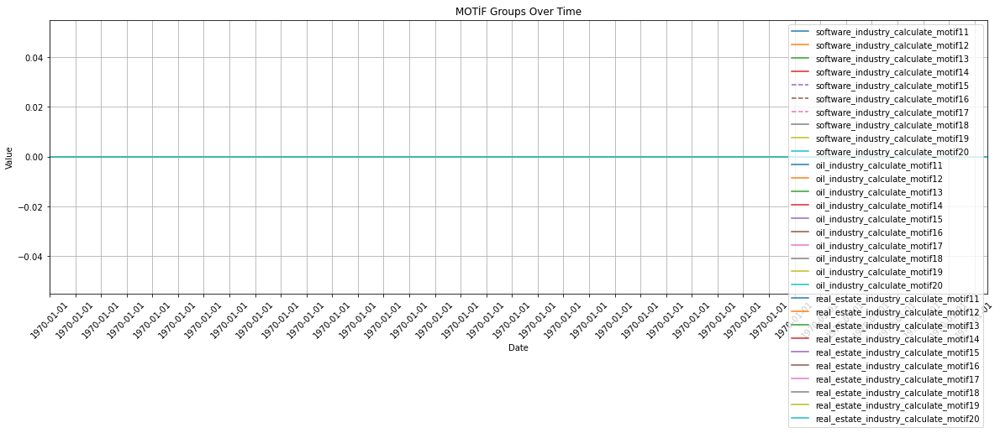

In [72]:
def drop_cols(df, substring):
    return df.loc[:, ~df.columns.str.contains(substring)]

def create_dataframe_with_substring(df, substring):
    filtered_columns = [col for col in df.columns if substring in col]
    return df[filtered_columns]

substring = "total"
dfd = drop_cols(dataframe3.copy(), substring)


plot_dataframe(dfd, "MOTİF Groups Over Time")

In [28]:
def find_closest_number_with_equal_ends(number):
    # Convert the number to a string for easier manipulation
    number_str = str(number)

    # Iterate through possible candidates
    for i in range(number - 1, 0, -1):
        candidate_str = str(i)

        # Check if the first and last digits are equal
        if candidate_str[0] == candidate_str[-1]:
            return int(candidate_str)

    for i in range(number + 1, 10**len(number_str)):
        candidate_str = str(i)

        # Check if the first and last digits are equal
        if candidate_str[0] == candidate_str[-1]:
            return int(candidate_str)

# Example usage:
number1 = 4004
number2 = 12451

closest_number1 = find_closest_number_with_equal_ends(number1)
closest_number2 = find_closest_number_with_equal_ends(number2)

print(f"Closest number with equal ends for {number1}: {closest_number1}")
print(f"Closest number with equal ends for {number2}: {closest_number2}")


Closest number with equal ends for 4004: 3993
Closest number with equal ends for 12451: 12441


In [29]:
closest_number2 = find_closest_number_with_equal_ends(31)

In [32]:
find_closest_number_with_equal_ends(2222)

2212